In [3]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2

In [4]:
import torch

In [5]:
from fastai import *
from fastai.vision import *
torch.backends.cudnn.benchmark=True
import time

from adamw import AdamW
from scheduler import Scheduler, LRScheduler
from models import *

import argparse

In [6]:
MODEL_PATH = Path('/ncluster/models')
MODEL_PATH.mkdir(exist_ok=True)
save_tag = 'resnet_test'

### Data

In [7]:
PATH = Path('../data')

# IMAGENET_PATH = PATH/'imagenet-sz/320/train'
# train_ds = ImageClassificationDataset.from_folder(IMAGENET_PATH)
# COCO_PATH = PATH/'coco/resize'

COCO_PATH = PATH/'coco_sample/train_sample'
train_ds = ImageClassificationDataset.from_single_folder(COCO_PATH, ['train_sample'])

In [8]:
# size,bs = 96,36
# size,bs = 128,32
size,bs = 256,1

# Content Data
data_norm,data_denorm = normalize_funcs(*imagenet_stats)
train_tds = DatasetTfm(train_ds, tfms=[crop_pad(size=size, is_random=False)], tfm_y=False, size=size, do_crop=True)

data_sampler = None
train_dl = DeviceDataLoader.create(train_tds, tfms=data_norm, num_workers=8, bs=bs, shuffle=(data_sampler is None), sampler=data_sampler)

# Style Data

STYLE_PATH = PATH/'style/dtd/images'
# STYLE_PATH = PATH/'style/dtd/subset'
style_ds = ImageClassificationDataset.from_folder(STYLE_PATH)

# STYLE_PATH = PATH/'style/pbn/train'
# style_ds = ImageClassificationDataset.from_single_folder(STYLE_PATH, ['train'])

style_tds = DatasetTfm(style_ds, tfms=[crop_pad(size=size, is_random=False)], tfm_y=False, size=size, do_crop=True)
style_dl = DeviceDataLoader.create(style_tds, tfms=data_norm, num_workers=8, bs=1, shuffle=True)

## Create models

In [9]:
# Create models
mt = StyleTransformer()
ms = StylePredict.create_resnet()
# ms = StylePredict.create_inception()
m_com = CombinedModel(mt, ms)

In [10]:
# m_vgg = VGGActivations()

### Set params

In [11]:
# m_com.load_state_dict(torch.load(MODEL_PATH/f'model_combined_4_imagenet_256.pth'), strict=False)
m_com.load_state_dict(torch.load(MODEL_PATH/f'{save_tag}.pth', map_location='cpu'), strict=True)

In [21]:
def eval_imgs(x_con, x_style, model=m_com, idx=0):
    with torch.no_grad(): 
        out = m_com(x_con, x_style)
    fig, axs = plt.subplots(1,3,figsize=(12,4))
    Image(data_denorm(x_con[idx].cpu())).show(axs[0])
    axs[0].set_title('Content')
    axs[1].set_title('Style')
    axs[2].set_title('Transfer')
    Image(data_denorm(x_style[0].cpu())).show(axs[1])
    Image((out[idx].detach().cpu())).show(axs[2])
    

In [63]:
x_con,_ = next(iter(train_dl))

Traceback (most recent call last):
  File "/home/ubuntu/anaconda3/envs/fastai/lib/python3.7/multiprocessing/util.py", line 265, in _run_finalizers
    finalizer()
  File "/home/ubuntu/anaconda3/envs/fastai/lib/python3.7/multiprocessing/util.py", line 189, in __call__
    res = self._callback(*self._args, **self._kwargs)
  File "/home/ubuntu/anaconda3/envs/fastai/lib/python3.7/shutil.py", line 489, in rmtree
    onerror(os.rmdir, path, sys.exc_info())
  File "/home/ubuntu/anaconda3/envs/fastai/lib/python3.7/shutil.py", line 487, in rmtree
    os.rmdir(path)
OSError: [Errno 39] Directory not empty: '/tmp/pymp-xeikea3i'


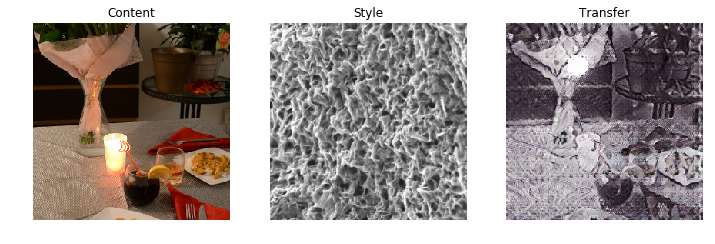

In [52]:
x_style,_ = next(iter(style_dl))
eval_imgs(x_con, x_style)

In [33]:
x_style,_ = next(iter(style_dl))

CPU times: user 10.4 s, sys: 348 ms, total: 10.7 s
Wall time: 3.5 s


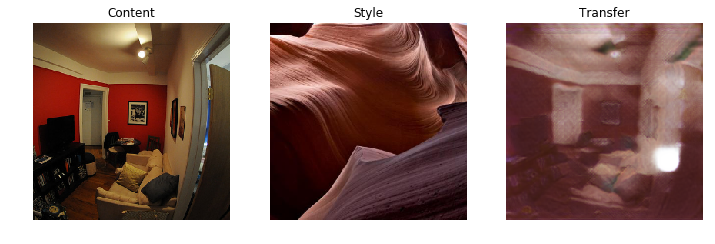

In [34]:
%time eval_imgs(x_con, x_style)

### JIT

In [53]:
traced_model = torch.jit.trace(m_com, (x_style, x_style))

CPU times: user 10.4 s, sys: 372 ms, total: 10.8 s
Wall time: 3.52 s


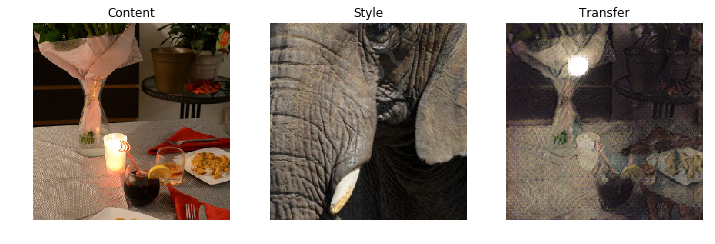

In [54]:
x_style,_ = next(iter(style_dl))
%time eval_imgs(x_con, x_style, model=traced_model)

In [55]:
torch.jit.save(traced_model, str(MODEL_PATH/f'{save_tag}_jit.pth'))

### Loading saved JIT

In [22]:
jit_model = torch.jit.load(str(MODEL_PATH/f'{save_tag}_jit.pth'))

CPU times: user 9.95 s, sys: 292 ms, total: 10.2 s
Wall time: 3.37 s


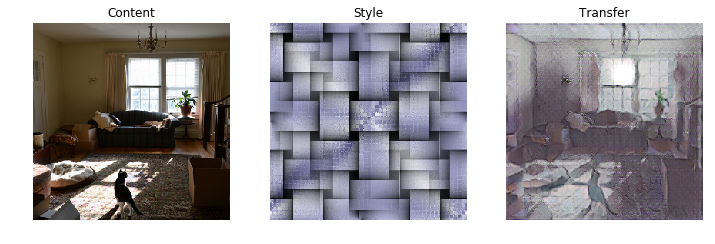

In [64]:
x_style,_ = next(iter(style_dl))
%time eval_imgs(x_con, x_style, model=jit_model)

### Downloaded Image

In [141]:
from fastai.vision.data import download_image

In [142]:
magenta_url = 'https://github.com/tensorflow/magenta/blob/master/magenta/models/arbitrary_image_stylization/images'

In [143]:
con_images = ['colva_beach_sq.jpg', 'eiffel_tower.jpg', 'golden_gate_sq.jpg', 'statue_of_liberty_sq.jpg']
con_urls = [f'{magenta_url}/content_images/{fn}?raw=true' for fn in content_images]

In [153]:
style_images = ['Camille_Mauclair.jpg', 'La_forma.jpg', 'Theo_van_Doesburg_sq.jpg', 'black_zigzag.jpg', 'bricks_sq.jpg',
               'clouds-over-bor-1940_sq.jpg', 'piano-keyboard-sketch_sq.jpg', 'pink_zigzag.jpg', 'red_texture_sq.jpg',
               'towers_1916_sq.jpg', 'zigzag_colorful.jpg']
style_urls = [f'{magenta_url}/style_images/{fn}?raw=true' for fn in style_images]

In [145]:
def get_img(url, fn):
    tmp_path = PATH/'tmp/images'/fn
    tmp_path.parent.mkdir(parents=True, exist_ok=True)
    download_image(url, tmp_path)
    return tmp_path

In [146]:
def tfm_img(img_fn):
    img = open_image(img_fn)
    return data_norm((apply_tfms(style_tds.tfms, img.resize(size)).px,None))[0]

In [147]:
def eval_urls(con_url, style_url, model=m_com):
    con_fn = get_img(con_url, 'con.jpg')
    style_fn = get_img(style_url, 'style.jpg')
    x_con = tfm_img(con_fn).unsqueeze(0)
    x_style = tfm_img(style_fn).unsqueeze(0)
    eval_imgs(x_con, x_style, model)

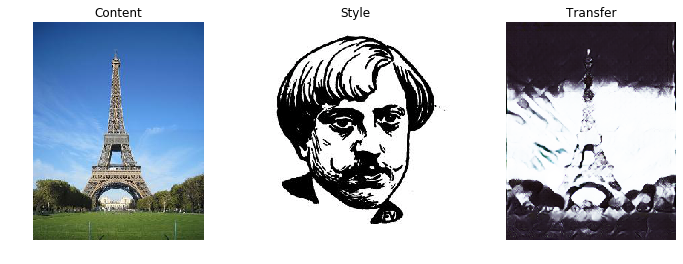

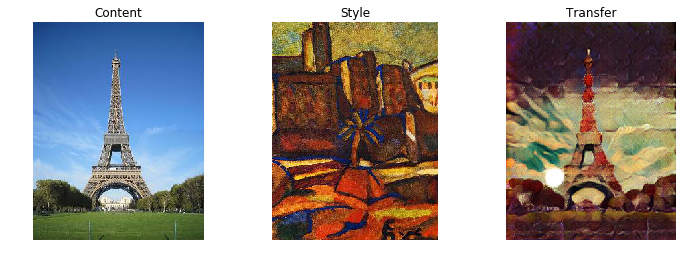

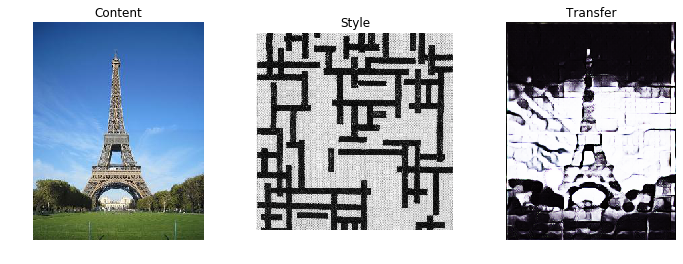

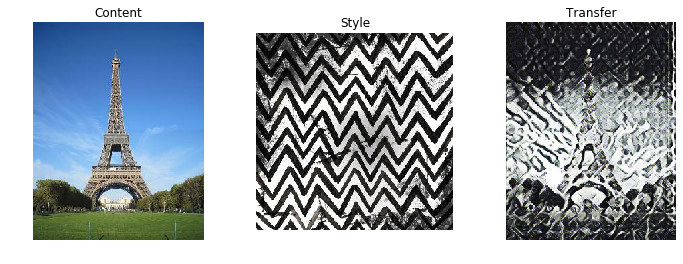

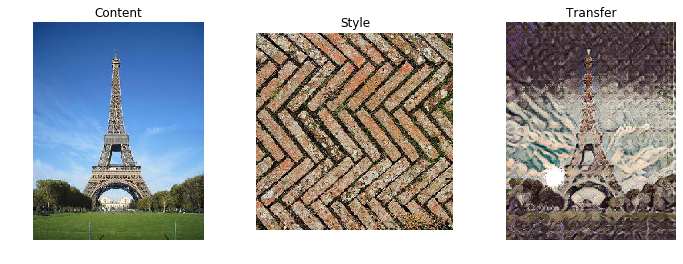

...

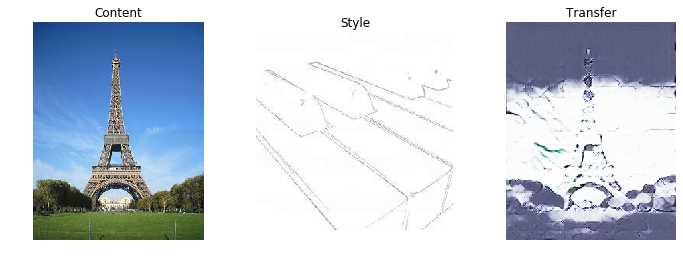

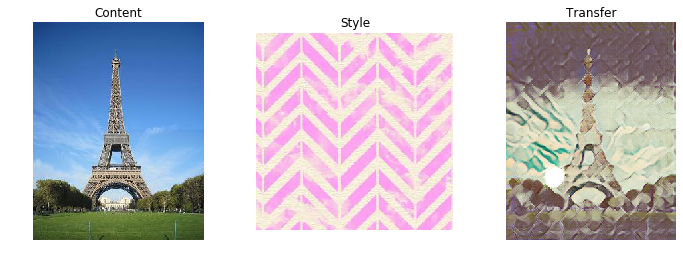

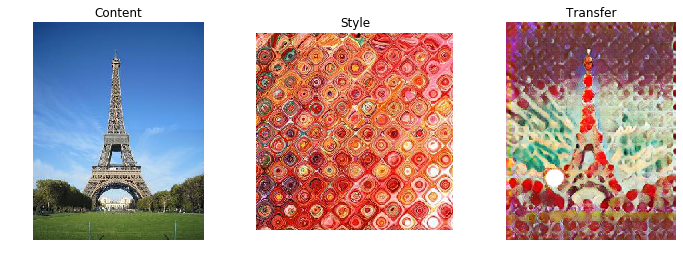

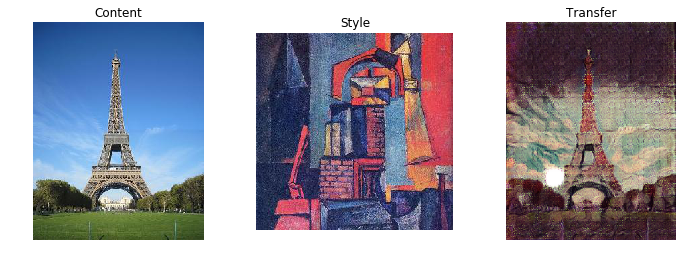

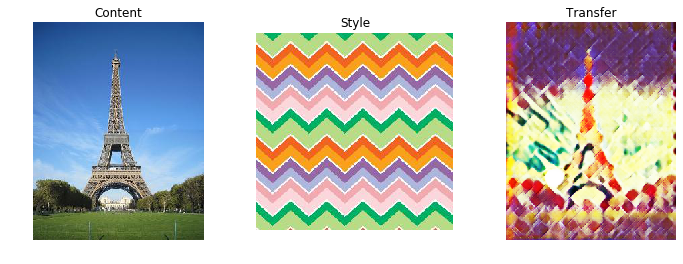

In [159]:
for style_url in style_urls:
    eval_urls(con_urls[1], style_url, jit_model)

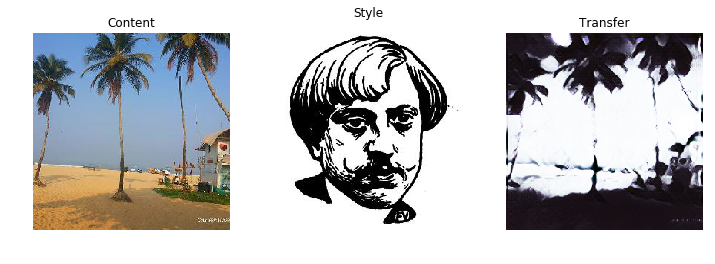

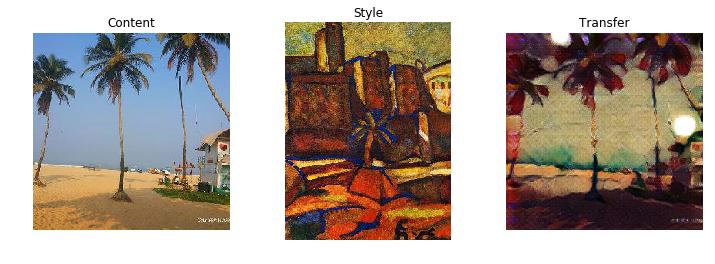

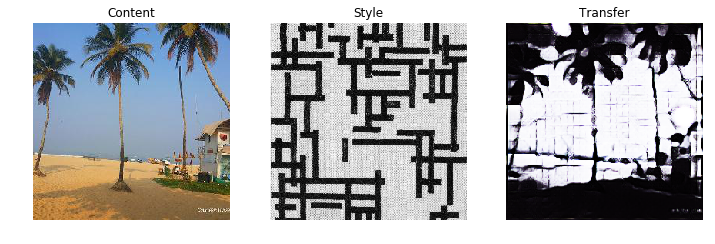

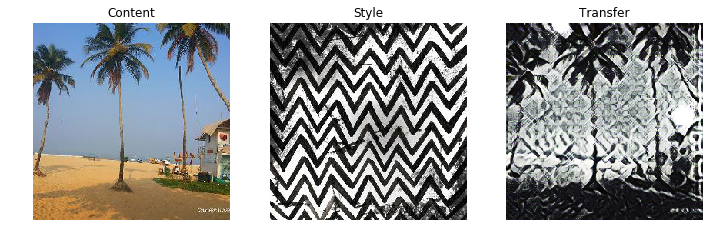

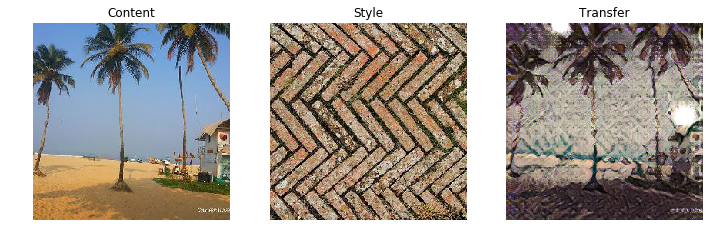

...

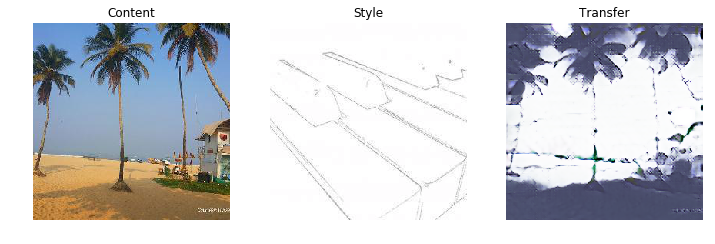

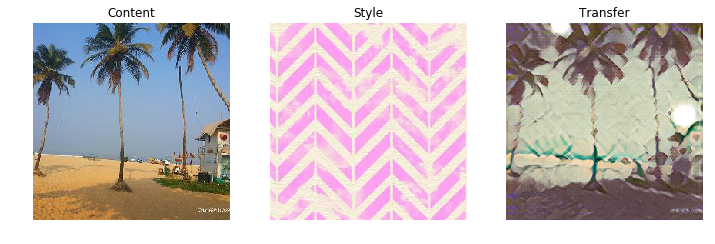

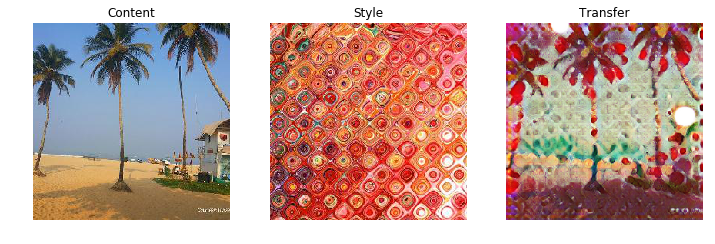

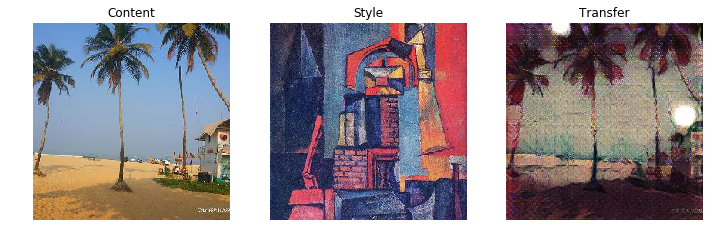

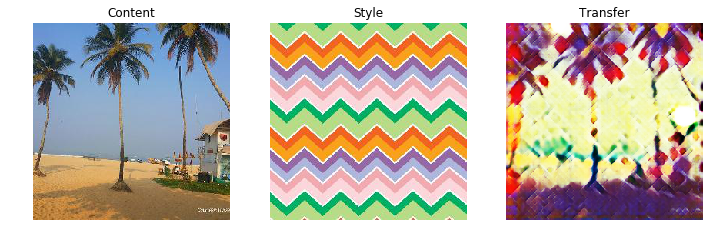

In [160]:
for style_url in style_urls:
    eval_urls(con_urls[0], style_url, jit_model)

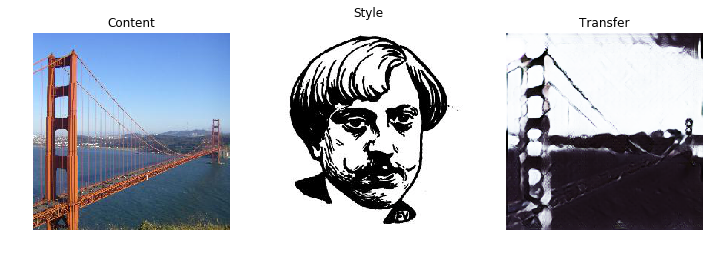

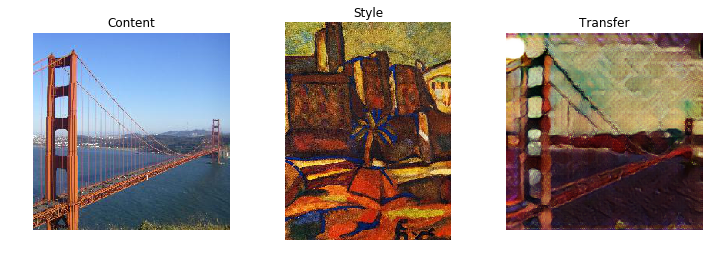

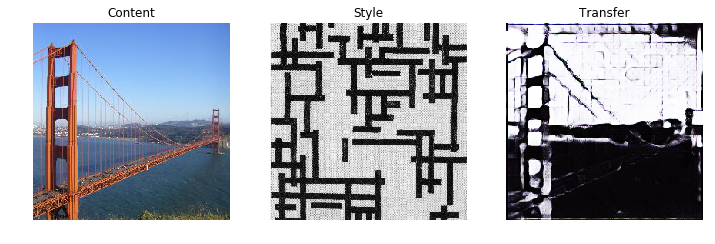

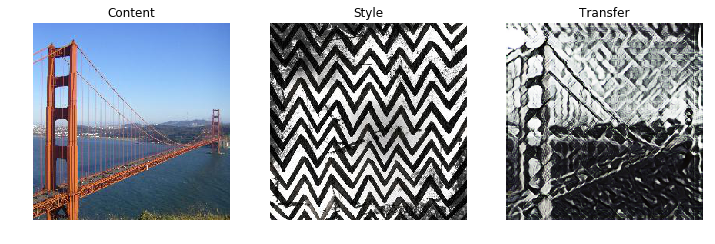

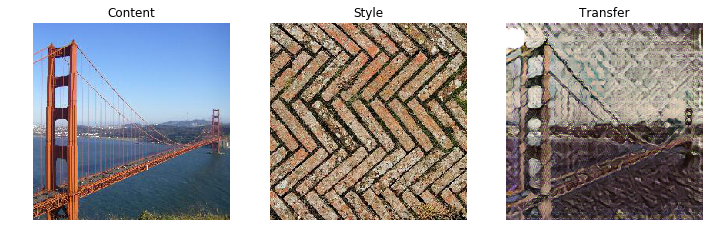

...

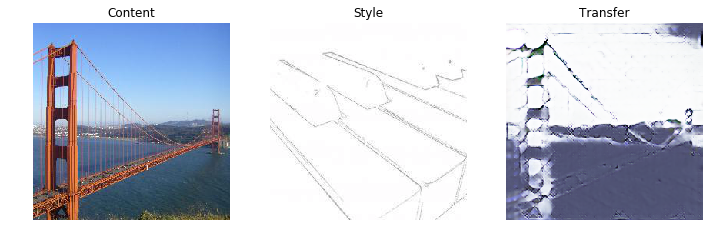

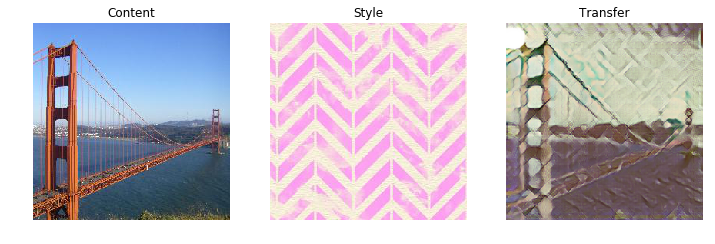

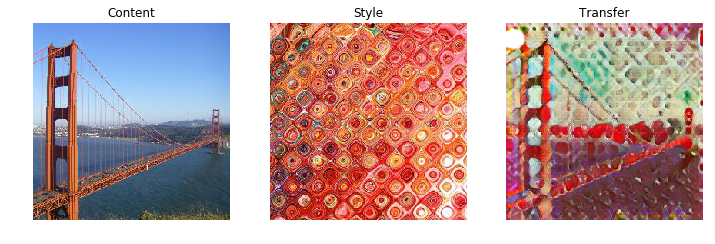

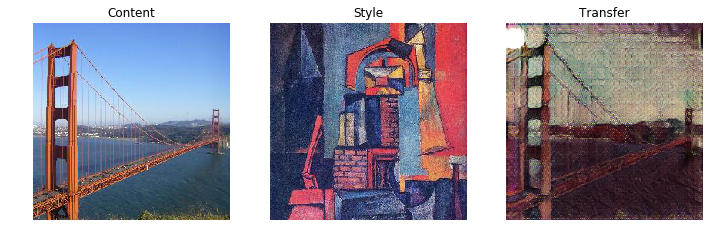

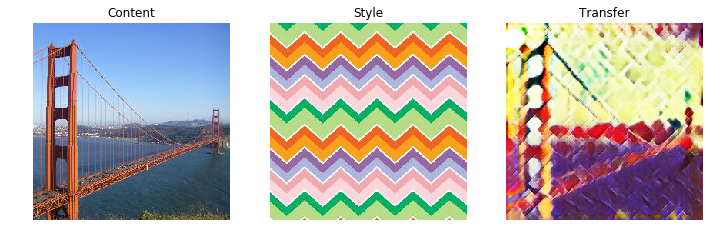

In [161]:
for style_url in style_urls:
    eval_urls(con_urls[2], style_url, jit_model)